# Import libraries

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
import os
from sklearn.preprocessing import RobustScaler
from sklearn.manifold import TSNE
from umap import UMAP
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.cluster import DBSCAN
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from ipywidgets import interact

# Read Data

In [6]:
df = pd.read_csv('../input/creditcardfraud/creditcard.csv')
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


# EDA
Проверим есть ли отсутствующие данные.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

В датасете нет пропусков в данных.

Посмотрим на распределение числовых признаков.

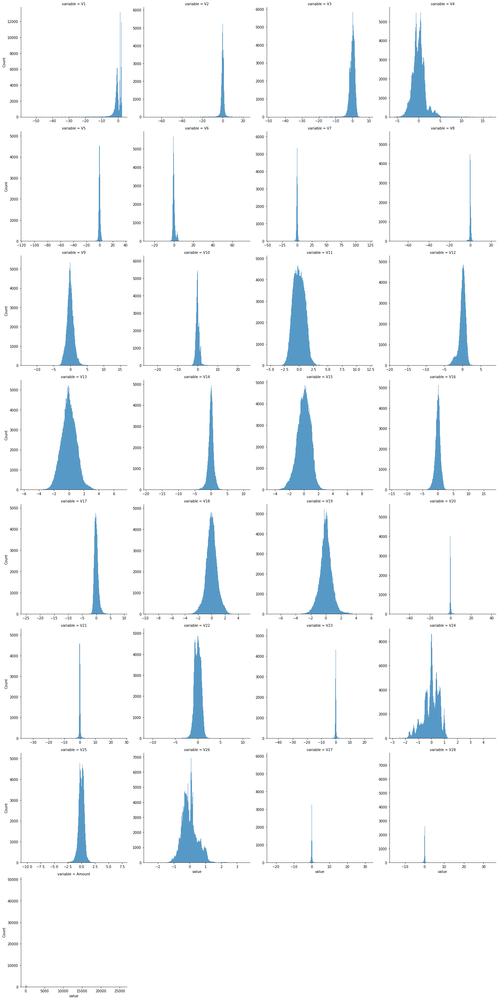

In [8]:
# Transform to long format for visualisation
df_long = df.melt(id_vars=['Time', 'Class'], var_name='variable')
sns.displot(data=df_long, kind='hist', x='value', col='variable', col_wrap=4, 
            common_bins=False, facet_kws={'sharex': False, 'sharey': False})
plt.show()

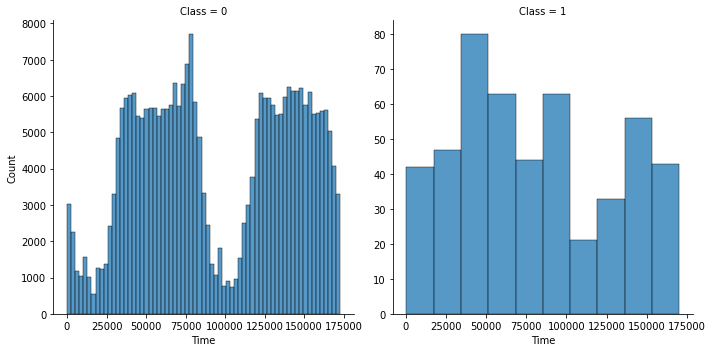

In [9]:
sns.displot(data=df, kind='hist', x='Time', col='Class',common_bins=False, 
            facet_kws={'sharex': False, 'sharey': False})
plt.show()

In [10]:
pd.set_option('display.max_columns', 500)
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,2.239053e-15,1.673327e-15,-1.247012e-15,8.190001e-16,1.207294e-15,4.887456e-15,1.437716e-15,-3.772171e-16,9.564149e-16,1.039917e-15,6.406204e-16,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


Распределение числовых переменных близко к нормальному распределению.

Посмотрим на корреляции. Переменная Time (время между транзакцией и первой транзакцией в датасете) нас не интересует.

In [11]:
df = df.loc[:, df.columns!='Time']

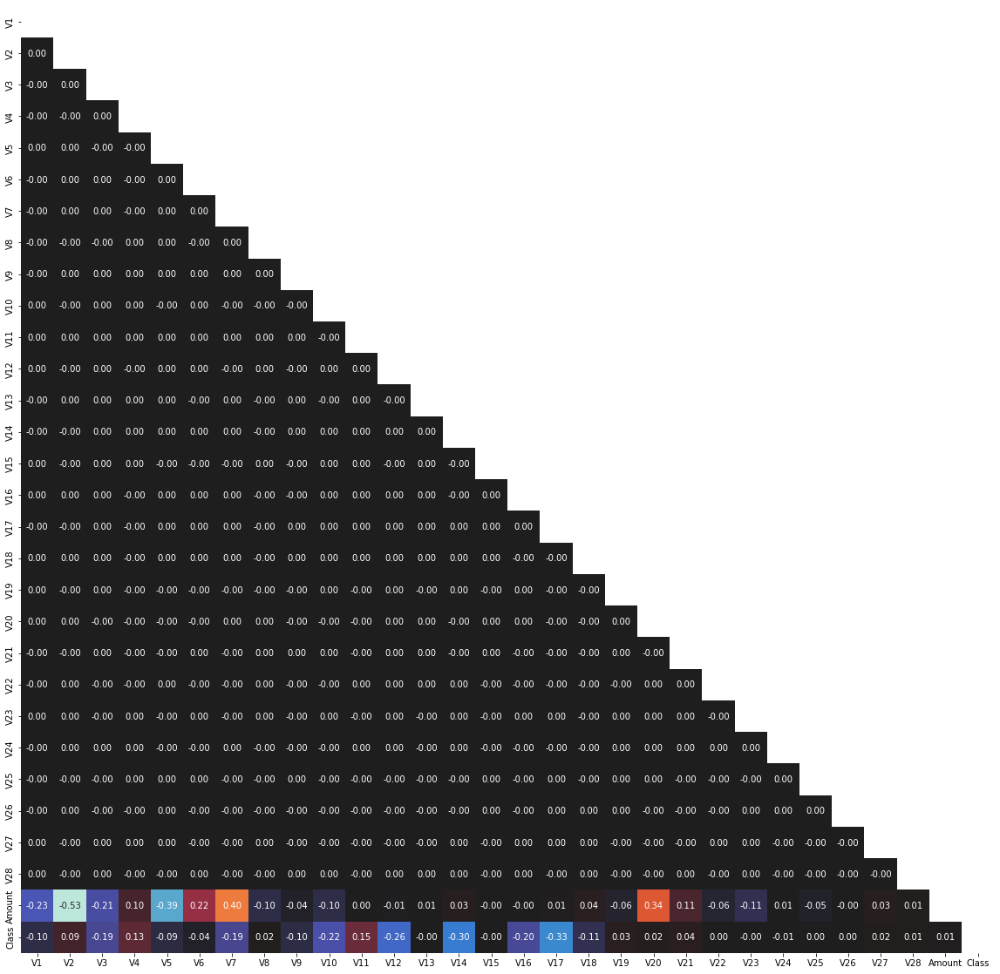

In [12]:
plt.figure(figsize=(20, 20))
corr_mat = df.corr()
lower = corr_mat.where(np.tril(np.ones(corr_mat.shape), k=-1).astype('bool'))
sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0)
plt.show()

Имеем только слабые и средние корреляции, в основном между Amount/Class и другими переменными.

In [13]:
some_corr = [
    column for column in lower.columns if any((lower[column] > 0.2)|(lower[column] < -0.2))
]
some_corr

['V1', 'V2', 'V3', 'V5', 'V6', 'V7', 'V10', 'V12', 'V14', 'V17', 'V20']

<Figure size 1440x1440 with 0 Axes>

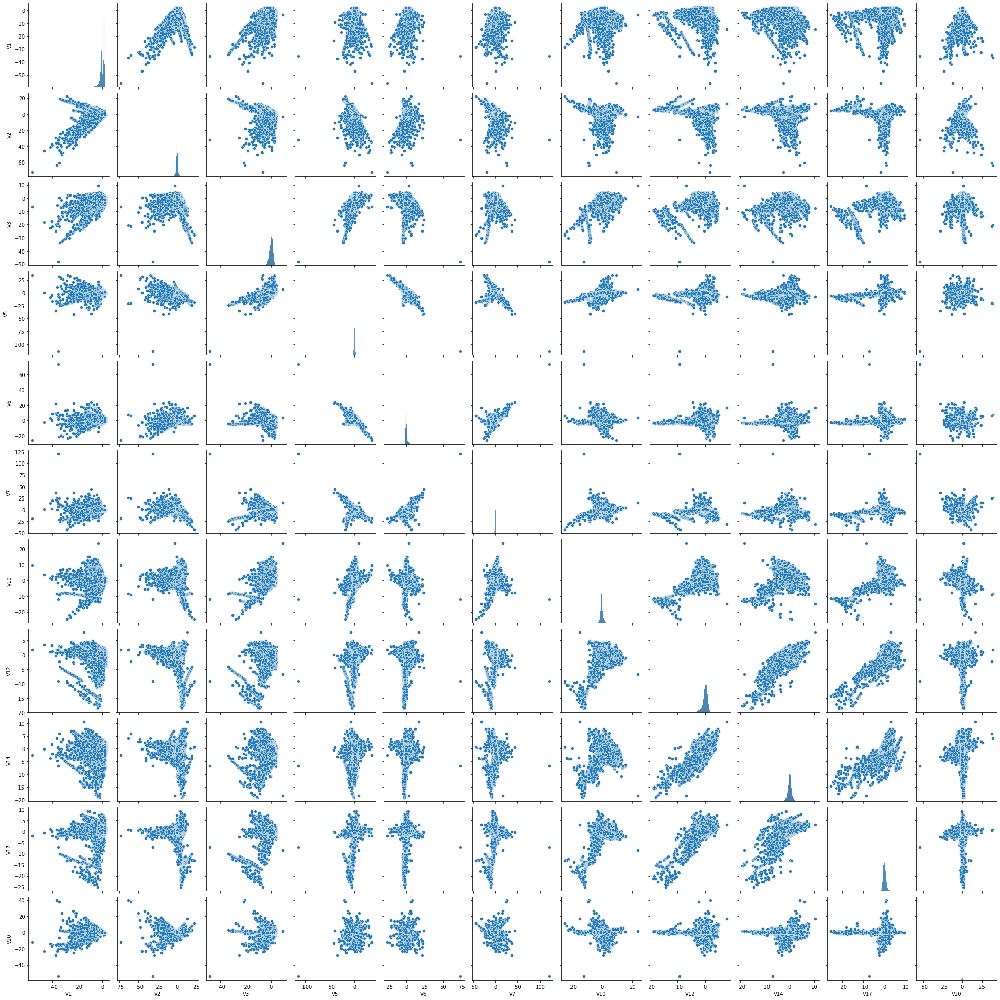

In [14]:
plt.figure(figsize=(20,20))
sns.pairplot(df[some_corr])
plt.show()

# Поиск аномалий
Какой процент аномалий нам ожидать в данных? Воспользуемся перемнной Class для оценки этого.

In [15]:
df['Class'].value_counts(normalize=True)

0    0.998273
1    0.001727
Name: Class, dtype: float64

0.17% - процент аномалий в наших данных.

Для оценки методов поиска аномалий воспользуемся:
- методами оценки качества бинарной классификации
- визуализацией данных на двухмерной плоскости с помощью tSNE и UMAP

In [16]:
expert_threshold = 0.0017

In [17]:
# drop target
X = df.drop('Class', axis=1)
# scale
scaler = RobustScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
# expert target
target = df['Class']

In [18]:
def get_column_outliers(data, columns=None, function=None, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
        
    outliers = pd.Series(data=[False]*len(data), index=data.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(by='anomalies_percentage', ascending=False)
    
    return comparison_table, outliers.astype('int8')

def find_threshold(threshold_start=3, expert_thres=expert_threshold, thres_step=1, debug=False, **kwargs):
    threshold = threshold_start
    anomaly_pct = 1
    while anomaly_pct > expert_thres:
        outliers = get_column_outliers(threshold=threshold, **kwargs)[1]
        anomaly_pct = round(np.mean(outliers), 4)
        if debug:
            print(f'{threshold}: {anomaly_pct}')
        threshold += thres_step
    return threshold - thres_step
        
    
def confusion_df (y_true, y_pred):
    conf_mat = pd.DataFrame(confusion_matrix(y_true, y_pred))
    conf_mat.index.name = 'class'
    conf_mat.columns.name = 'prediction'
    return conf_mat

def anomalies_report(outliers, y_true):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            outliers.sum(), 100*outliers.mean()))
    print('\nConfusion Matrix:')
    display(confusion_df(y_true, outliers))
    print('\nClassification Report:')
    print(classification_report(y_true, outliers))

## N-сигм

In [19]:
def outlier_std(data, col, threshold=3):
    mu = data[col].mean()
    std = data[col].std()
    upper_bound = mu + threshold * std
    lower_bound = mu - threshold * std
    anomalies = (data[col] < lower_bound) | (data[col] > upper_bound)
    return anomalies, upper_bound, lower_bound

In [20]:
std_threshold = find_threshold(data=X, function=outlier_std)
print('Chosen threshold = ', std_threshold)
comparison_table, std_outliers = get_column_outliers(X, function=outlier_std, threshold=std_threshold)
anomalies_report(std_outliers, target)

Chosen threshold =  18
Total number of outliers: 498
Percentage of outliers:   0.17%

Confusion Matrix:


prediction,0,1
class,,
0,283906,409
1,403,89



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.18      0.18      0.18       492

    accuracy                           1.00    284807
   macro avg       0.59      0.59      0.59    284807
weighted avg       1.00      1.00      1.00    284807



С использованием экспертной оценки мы получаем очень низкий процент пойманных аномалий, метод не подходит для unsupervised поиска случаев мошенничества. Можно уменьшить количество отклонений и увеличить процент пойманных аномалий. Например взять часто используемое значение равное 3м:

In [21]:
comparison_table, std_outliers_2 = get_column_outliers(X, threshold=3, function=outlier_std)
anomalies_report(std_outliers_2, target)

Total number of outliers: 37816
Percentage of outliers:   13.28%

Confusion Matrix:


prediction,0,1
class,,
0,246943,37372
1,48,444



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.87      0.93    284315
           1       0.01      0.90      0.02       492

    accuracy                           0.87    284807
   macro avg       0.51      0.89      0.48    284807
weighted avg       1.00      0.87      0.93    284807



Таким образом процент аномалий возрастает до более чем **13%**, отлавливается **90%** всех аномалий, но у в разы увеличивается количество лигитимных транзакций, которые попадают под подозрение: **37372 vs. 409**.

## Межквартильное отклонение

In [22]:
def outlier_iqr(data, col, threshold=1.5):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    upper_bound = data[col].quantile(0.75) + (IQR * threshold)
    lower_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = (data[col] < lower_bound) | (data[col] > upper_bound)
    return anomalies, upper_bound, lower_bound

In [23]:
iqr_threshold = find_threshold(data=X, function=outlier_iqr)
print('Chosen threshold = ', iqr_threshold)
comparison_table, iqr_outliers = get_column_outliers(X, function=outlier_iqr, threshold=iqr_threshold)
anomalies_report(iqr_outliers, target)

Chosen threshold =  43
Total number of outliers: 480
Percentage of outliers:   0.17%

Confusion Matrix:


prediction,0,1
class,,
0,283850,465
1,477,15



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.03      0.03      0.03       492

    accuracy                           1.00    284807
   macro avg       0.51      0.51      0.51    284807
weighted avg       1.00      1.00      1.00    284807



Мы получили примерно тот же результат, что и с использованием метода со стандратным отклонением: не подходит для unsupervised отлова мошеннических транзакций.  
Аналогично можно уменьшить threshold и посмотреть на результат:

In [24]:
comparison_table, iqr_outliers_2 = get_column_outliers(X, threshold=3, function=outlier_iqr)
anomalies_report(iqr_outliers_2, target)

Total number of outliers: 53336
Percentage of outliers:   18.73%

Confusion Matrix:


prediction,0,1
class,,
0,231431,52884
1,40,452



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.81      0.90    284315
           1       0.01      0.92      0.02       492

    accuracy                           0.81    284807
   macro avg       0.50      0.87      0.46    284807
weighted avg       1.00      0.81      0.90    284807



Таким образом процент аномалий возрастает до почти **19%**, отлавливается **92%** всех аномалий, но у в разы (даже больше чем с предыдущим методом) увеличивается количество лигитимных транзакций, которые попадают под подозрение: **52884 vs. 465**.

## Distance-based

In [25]:
class DistanceOutliers(BaseEstimator):
    """
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

In [26]:
def dst_find_and_report(percentile=(1-expert_threshold)*100, metric='euclidean', report=True):
    model = DistanceOutliers(percentile=percentile, metric=metric)
    model.fit(X)
    dst_outliers = model.predict(X)
    if report:
        anomalies_report(dst_outliers, target)
    return dst_outliers

In [27]:
dst_outliers = dst_find_and_report()

Total number of outliers: 485
Percentage of outliers:   0.17%

Confusion Matrix:


prediction,0,1
class,,
0,283848,467
1,474,18



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.04      0.04      0.04       492

    accuracy                           1.00    284807
   macro avg       0.52      0.52      0.52    284807
weighted avg       1.00      1.00      1.00    284807



Результат не отличается от прошлых. Скорее всего метод так же не подходит для unsupervised поиска мошннических транзакций. Но можно попробовать следующее:
1. Другие методы расчета расстояний (выбор той, где больше recall)
2. Уменьшение percentile (увеличение процента найденных аномалий)

In [28]:
metrics = ['euclidean', 'minkowski', 'cityblock', 'seuclidean', 'sqeuclidean', 'cosine', 
           'correlation', 'hamming', 'jaccard', 'jensenshannon', 'chebyshev', 'canberra', 
           'braycurtis', 'mahalanobis', 'yule', 'matching', 'dice', 'rogerstanimoto', 
           'russellrao', 'sokalmichener', 'sokalsneath']
recalls = np.zeros(len(metrics))
for i, metric in enumerate(metrics):
    dst_outliers = dst_find_and_report(metric=metric, report=False)
    cf = classification_report(target, dst_outliers, output_dict=True, zero_division=0)
    recalls[i] = cf['1']['recall']
best_id = np.where(recalls == recalls.max())[0][0]
best_metric = metrics[best_id]
print('The best metric is ', best_metric)
dst_outliers = dst_find_and_report(metric=best_metric)

/opt/conda/lib/python3.7/site-packages/numpy/lib/function_base.py:4009: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


The best metric is  seuclidean
Total number of outliers: 485
Percentage of outliers:   0.17%

Confusion Matrix:


prediction,0,1
class,,
0,283944,371
1,378,114



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.24      0.23      0.23       492

    accuracy                           1.00    284807
   macro avg       0.62      0.62      0.62    284807
weighted avg       1.00      1.00      1.00    284807



Результат вышел намного лучше, отловили 23% случаев мошенничества. Можно попробовать увеличить процент аномалий выше экспертной оценки:

In [29]:
anomaly_pct = [1, 5, 10]
dst_outliers_list = [dst_outliers]
for pct in anomaly_pct:
    dst_outliers_list.append(dst_find_and_report(percentile=100-pct, metric=best_metric))
    print('===============================================================================')

Total number of outliers: 2849
Percentage of outliers:   1.00%

Confusion Matrix:


prediction,0,1
class,,
0,281760,2555
1,198,294



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    284315
           1       0.10      0.60      0.18       492

    accuracy                           0.99    284807
   macro avg       0.55      0.79      0.59    284807
weighted avg       1.00      0.99      0.99    284807

Total number of outliers: 14241
Percentage of outliers:   5.00%

Confusion Matrix:


prediction,0,1
class,,
0,270506,13809
1,60,432



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.98    284315
           1       0.03      0.88      0.06       492

    accuracy                           0.95    284807
   macro avg       0.52      0.91      0.52    284807
weighted avg       1.00      0.95      0.97    284807

Total number of outliers: 28481
Percentage of outliers:   10.00%

Confusion Matrix:


prediction,0,1
class,,
0,256278,28037
1,48,444



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.90      0.95    284315
           1       0.02      0.90      0.03       492

    accuracy                           0.90    284807
   macro avg       0.51      0.90      0.49    284807
weighted avg       1.00      0.90      0.95    284807



С помощью подбора метрики для расчета расстояний и увеличения процента аномалий выше экспертной оценки (0.17%) можно отловить до 90% мошеннических транзакций (10% аномалий).

## DBSCAN (density-based)

In [30]:
def outlier_density(eps, X, metric='seuclidean', **kwargs):
    model = DBSCAN(eps, metric=metric, **kwargs)
    model.fit(X)
    outliers = (model.labels_ == -1).astype('int8')
    return outliers

In [31]:
if os.path.exists('density_outliers.npy'):
    density_outliers = np.load('density_outliers.npy')
else:
    density_outliers = outlier_density(3.5, X)
    np.save('density_outliers', density_outliers)
anomalies_report(density_outliers, target)

Total number of outliers: 10247
Percentage of outliers:   3.60%

Confusion Matrix:


prediction,0,1
class,,
0,274403,9912
1,157,335



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.97      0.98    284315
           1       0.03      0.68      0.06       492

    accuracy                           0.96    284807
   macro avg       0.52      0.82      0.52    284807
weighted avg       1.00      0.96      0.98    284807



При eps > 3.5 потребление памяти слишком большое, поэтому не предствляется возможности попрбовать значения выше.  
По итогу, с помощью DBSCAN мы смогли отловить 70% случаев мошенничества, но процент мошеннических транзакций среди найденный по прежнему очень низок (низкий precision).

## One-class SVM

In [32]:
import pickle
import os
def save_var(var, filename, root='OneClassSVM'):
    if not os.path.exists(root):
        os.makedirs(root)
    path = os.path.join(root, filename)
    with open(path, 'wb') as file:
        pickle.dump(var, file)

def load_var(filepath):
    if os.path.exists(filepath):
        with open(filepath, 'rb') as file:
            return pickle.load(file)
    else:
        return None

In [33]:
def outlier_svm(X, nu, kernel='rbf'):
    one_class_svm = OneClassSVM(nu=nu, gamma='auto', kernel=kernel)
    one_class_svm.fit(X)
    outliers = one_class_svm.predict(X)
    outliers = np.array([1 if label == -1 else 0 for label in outliers])
    return outliers

In [34]:
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
svm_outliers = {}
for kernel in kernels:
    print('kernel = ', kernel)
    outliers = load_var(os.path.join('OneClassSVM', kernel))
    if outliers is None:        
        outliers = outlier_svm(X, expert_threshold, kernel)
        save_var(outliers, kernel)
    anomalies_report(outliers, target)
    svm_outliers[kernel] = outliers

kernel =  linear
Total number of outliers: 24539
Percentage of outliers:   8.62%

Confusion Matrix:


prediction,0,1
class,,
0,259795,24520
1,473,19



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.91      0.95    284315
           1       0.00      0.04      0.00       492

    accuracy                           0.91    284807
   macro avg       0.50      0.48      0.48    284807
weighted avg       1.00      0.91      0.95    284807

kernel =  poly
Total number of outliers: 1150
Percentage of outliers:   0.40%

Confusion Matrix:


prediction,0,1
class,,
0,283165,1150
1,492,0



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.00      0.00      0.00       492

    accuracy                           0.99    284807
   macro avg       0.50      0.50      0.50    284807
weighted avg       1.00      0.99      1.00    284807

kernel =  rbf
Total number of outliers: 2739
Percentage of outliers:   0.96%

Confusion Matrix:


prediction,0,1
class,,
0,281711,2604
1,357,135



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    284315
           1       0.05      0.27      0.08       492

    accuracy                           0.99    284807
   macro avg       0.52      0.63      0.54    284807
weighted avg       1.00      0.99      0.99    284807

kernel =  sigmoid
Total number of outliers: 484
Percentage of outliers:   0.17%

Confusion Matrix:


prediction,0,1
class,,
0,283840,475
1,483,9



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.02      0.02      0.02       492

    accuracy                           1.00    284807
   macro avg       0.51      0.51      0.51    284807
weighted avg       1.00      1.00      1.00    284807



Лучший результат получился с rbf kernel, 0.96% аномалий и получилось отловить 27% мошеннических транзакций. Для улучшения качества можно попробовать увеличить процент аномалий.

In [35]:
svm_outliers_5 = outlier_svm(X, 0.05, 'rbf')
anomalies_report(svm_outliers_5, target)

Total number of outliers: 14253
Percentage of outliers:   5.00%

Confusion Matrix:


prediction,0,1
class,,
0,270485,13830
1,69,423



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97    284315
           1       0.03      0.86      0.06       492

    accuracy                           0.95    284807
   macro avg       0.51      0.91      0.52    284807
weighted avg       1.00      0.95      0.97    284807



Результат вышел лучше: 86% отловленных случаев мошенничества, но увеличивается процент false positive.

## Isolation Forest

In [36]:
def outlier_isolation_forest (X, contamination, n_estimators, **kwargs):
    isolation_forest = IsolationForest(n_estimators=n_estimators, contamination=contamination)
    isolation_forest.fit(X)
    isolation_outliers = isolation_forest.predict(X)
    isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])
    return isolation_outliers

In [37]:
isolation_outliers = outlier_isolation_forest(X, expert_threshold, 100, max_features=1.0, bootstrap=True)
anomalies_report(isolation_outliers, target)

/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  "X does not have valid feature names, but"


Total number of outliers: 485
Percentage of outliers:   0.17%

Confusion Matrix:


prediction,0,1
class,,
0,283955,360
1,367,125



Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.26      0.25      0.26       492

    accuracy                           1.00    284807
   macro avg       0.63      0.63      0.63    284807
weighted avg       1.00      1.00      1.00    284807



Процент аномалий вышел равным экспертной оценке (0.17%), поймано 22% мошеннических транзакций. Аналогично можно увеличить процент аномалий и посмотреть на качество.

In [38]:
cont_pcts = [0.01, 0.05, 0.1]
isolation_outliers_list = [isolation_outliers]
for contamination in cont_pcts:
    outliers = outlier_isolation_forest(X, contamination, 100, max_features=1.0, bootstrap=True)
    anomalies_report(outliers, target)
    isolation_outliers_list.append(outliers)

/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  "X does not have valid feature names, but"


Total number of outliers: 2849
Percentage of outliers:   1.00%

Confusion Matrix:


prediction,0,1
class,,
0,281735,2580
1,223,269



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    284315
           1       0.09      0.55      0.16       492

    accuracy                           0.99    284807
   macro avg       0.55      0.77      0.58    284807
weighted avg       1.00      0.99      0.99    284807



/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  "X does not have valid feature names, but"


Total number of outliers: 14241
Percentage of outliers:   5.00%

Confusion Matrix:


prediction,0,1
class,,
0,270491,13824
1,75,417



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.95      0.97    284315
           1       0.03      0.85      0.06       492

    accuracy                           0.95    284807
   macro avg       0.51      0.90      0.52    284807
weighted avg       1.00      0.95      0.97    284807



/opt/conda/lib/python3.7/site-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  "X does not have valid feature names, but"


Total number of outliers: 28481
Percentage of outliers:   10.00%

Confusion Matrix:


prediction,0,1
class,,
0,256274,28041
1,52,440



Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.90      0.95    284315
           1       0.02      0.89      0.03       492

    accuracy                           0.90    284807
   macro avg       0.51      0.90      0.49    284807
weighted avg       1.00      0.90      0.95    284807



При увеличении процента, растет процент случаев мошенничества, которые получается уловить, но так же увеличивается колличество false positive реакций на лигитимные транзакции.

# Визуализация
Для визуализации будем использовать t-SNE с ранее хорошо себя показавшей в distance методе метрикой - seuclidean:

In [39]:
# t-SNE
if os.path.exists('tSNE.npy'):
    X_tsne = np.load('tSNE.npy')
else:
    reducer1 = TSNE(n_components=2, perplexity=50, n_jobs = -1, metric='seuclidean', learning_rate='auto', random_state=777)
    X_tsne = reducer1.fit_transform(X)
    np.save('tSNE.npy', X_tsne)

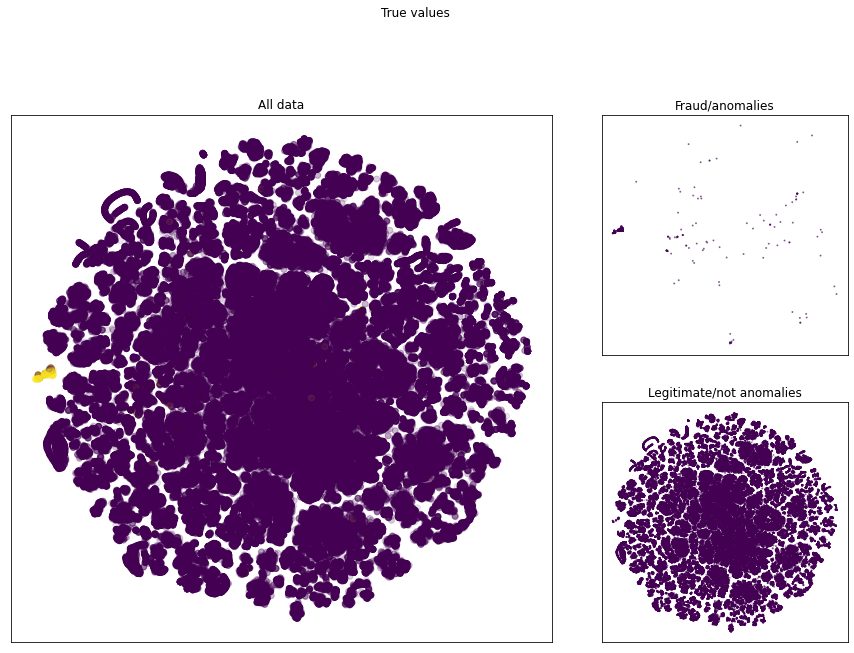

In [40]:
def scatter_2d (reduced, ax=None, clusters=None, title=None, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    ax.scatter(reduced[:, 0], reduced[:, 1], c=clusters, **kwargs)
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])
    return ax

def plot_reduced (reduced, clusters, title, figsize=(15,15), 
                  fraud_title='Fraud/anomalies', legit_title='Legitimate/not anomalies'):
    fig = plt.figure(figsize=figsize)
    fig.suptitle(title)
    ax1 = plt.subplot2grid((3, 3), (0,0), colspan=2, rowspan=2)
    ax2 = plt.subplot2grid((3,3), (0, 2), colspan=1, rowspan=1)
    ax3 = plt.subplot2grid((3,3), (1, 2), colspan=1, rowspan=1)
    scatter_2d(reduced, ax1, clusters, 'All data', alpha=0.1)
    index0 = np.where(clusters==0)
    index1 = np.where(clusters==1)
    scatter_2d(reduced[index1], ax2, clusters[index1], fraud_title, s=1, alpha=0.5)
    scatter_2d(reduced[index0], ax3, clusters[index0], legit_title, s=1, alpha=0.2)
    return fig

plot_reduced(X_tsne, target.to_numpy(), 'True values')
plt.show()

На визуализации видно, что большая часть мошеннических транзакций выделяется в отдельный кластер слева по середине. Остальные же разбросаны по всей 2D плоскости, на которую мы отобразили данные.

Визуализации результатов работы каждого из методов будут представлены ниже, в разделе сравнения.

# Финальное сравнение

In [41]:
outliers = {
    'STD': [std_outliers,std_outliers_2],
    'IQR': [iqr_outliers,iqr_outliers_2],
    'dst-based': dst_outliers_list,
    'density-based': [density_outliers],
    'SVM': [svm_outliers['rbf'], svm_outliers_5],
    'Isolation forest': isolation_outliers_list
}

In [42]:
def to_pct(val, d=2):
    return round(val * 100, d)

def calc_pcts(outliers, target=target):
    """
    Return:
    - percentage of found anomalies
    - percentage of caught frauds
    - number of false positives
    - percentage of false positives
    """
    conf_mat = confusion_df(target, outliers)
    anomaly_pct = to_pct(conf_mat[1].sum()/len(df))
    fraud_recall = to_pct(conf_mat.loc[1,1]/conf_mat.loc[1].sum())
    fp = conf_mat.loc[0,1]
    fp_pct = to_pct(fp/conf_mat.loc[0].sum())
    return anomaly_pct, fraud_recall, fp, fp_pct

In [43]:
# dictionary to record results for final comparison
columns = ['method', 'anomalies %', 'caught frauds %', 'fp count', 'fp %', 'outliers']
comparison_dict = dict()
record_list = []
for col in columns:
    comparison_dict[col] = list()
    record_list.append(comparison_dict[col])

def append_to_many (lists, new):
    assert len(lists) == len(new)
    for i in range(len(new)):
        lists[i].append(new[i])
    
for key, item in outliers.items():
    for out in item:
        new = [key] + list(calc_pcts(out)) + [out]
        append_to_many(record_list, new)
        
comparison_df = pd.DataFrame(comparison_dict)

In [44]:
comparison_df.drop('outliers', axis=1).sort_values(['anomalies %', 'caught frauds %'], ascending=[True, False])

,method,anomalies %,caught frauds %,fp count,fp %
11,Isolation forest,0.17,25.41,360,0.13
4,dst-based,0.17,23.17,371,0.13
0,STD,0.17,18.09,409,0.14
2,IQR,0.17,3.05,465,0.16
9,SVM,0.96,27.44,2604,0.92
5,dst-based,1.00,59.76,2555,0.90
12,Isolation forest,1.00,54.67,2580,0.91
8,density-based,3.60,68.09,9912,3.49
6,dst-based,5.00,87.80,13809,4.86
10,SVM,5.00,85.98,13830,4.86


In [45]:
def show_image(filepath):
    img = mpimg.imread(filepath)
    fig, ax = plt.subplots(figsize=(20,20))
    ax.imshow(img)
    ax.set_axis_off()
    ax.set_ylim(700, 0)
    return fig
    
def viz_options(option, cache_dir='viz'):
    if option < len(comparison_df):        
        row = comparison_df.loc[option]
        clusters = row['outliers']
        if isinstance(clusters, pd.Series):
            clusters = clusters.to_numpy()
        fraud_title = f"Anomalies ({row['caught frauds %']}% of frauds)"
        legit_title = f"{row['fp count']}({row['fp %']}%) missing (considered anomaly)"
    else:
        clusters = target.to_numpy()
        fraud_title='Fraud/anomalies', 
        legit_title='Legitimate/not anomalies'
    title = options[option][0]
    filepath = os.path.join(cache_dir, title+'.png')
    if not os.path.exists(filepath):
        fig = plot_reduced(X_tsne, clusters, options[option][0], fraud_title=fraud_title, legit_title=legit_title)
        fig.savefig(filepath)
        plt.close()
    fig = show_image(filepath)
    plt.show()

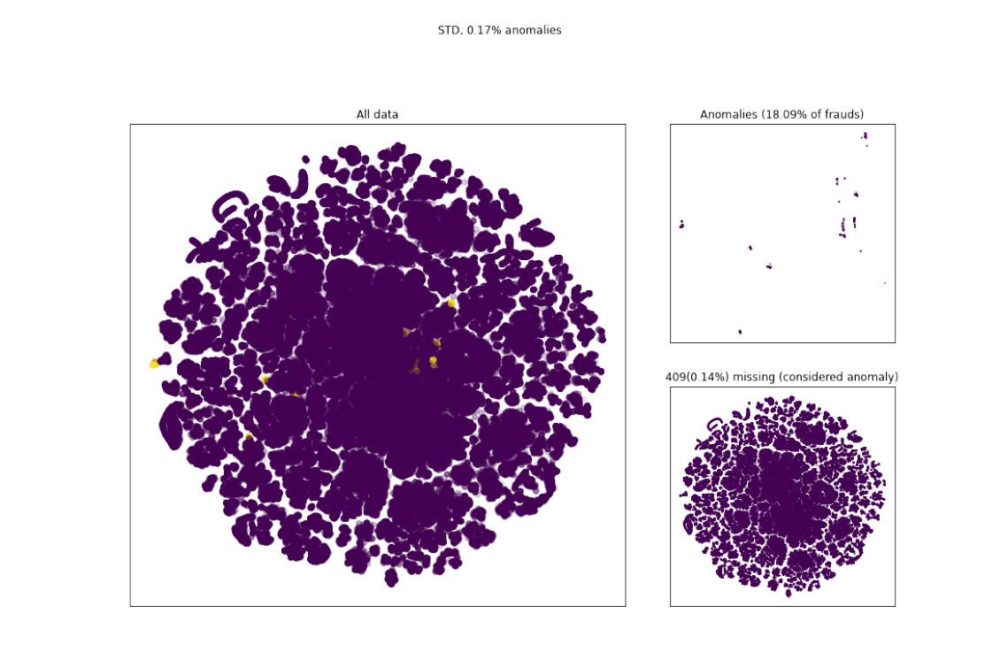

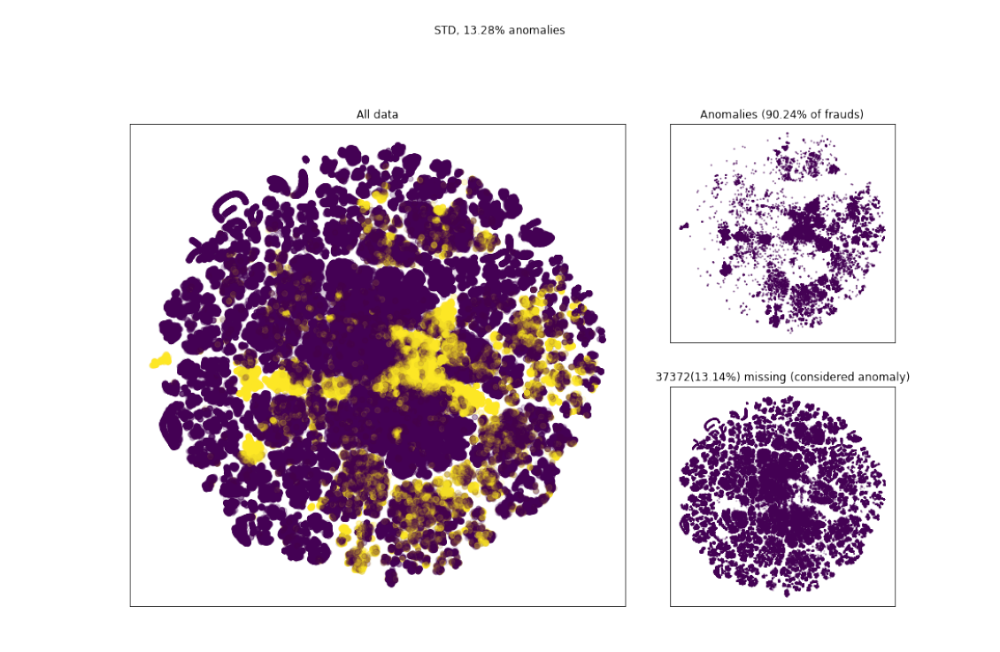

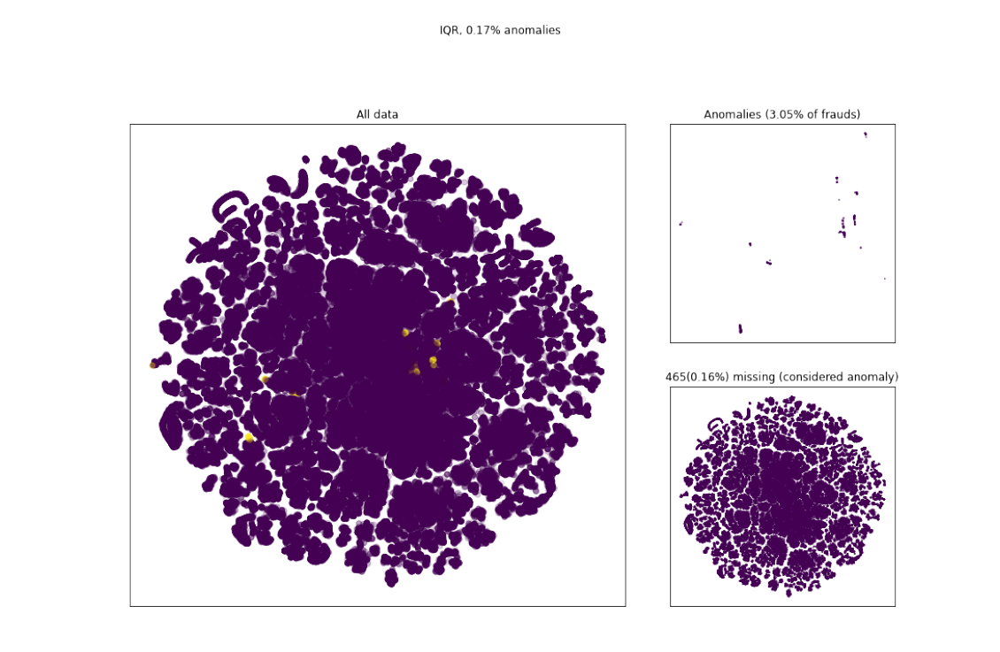

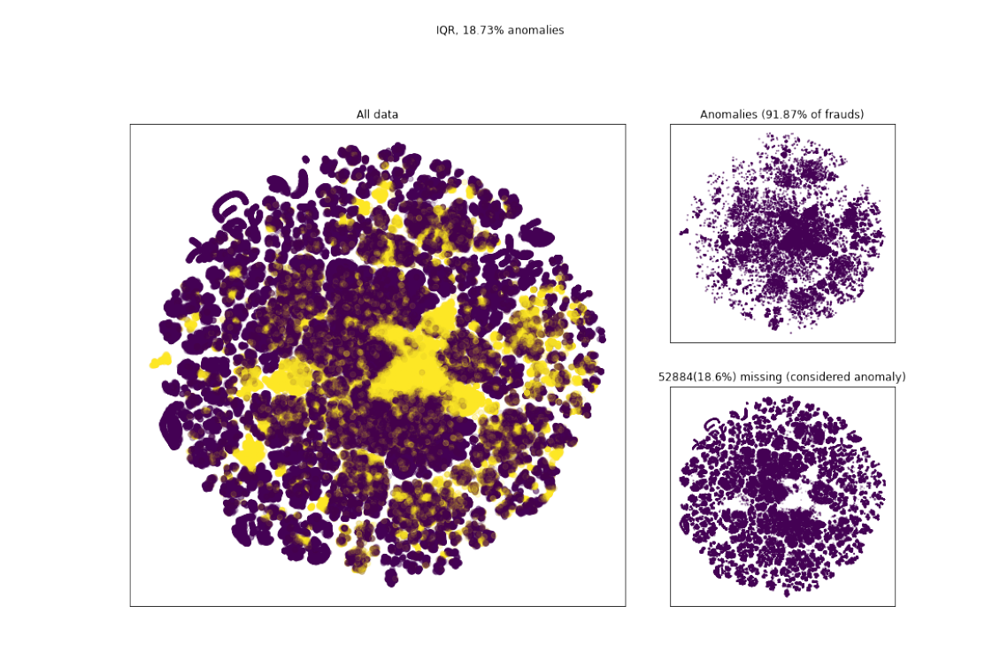

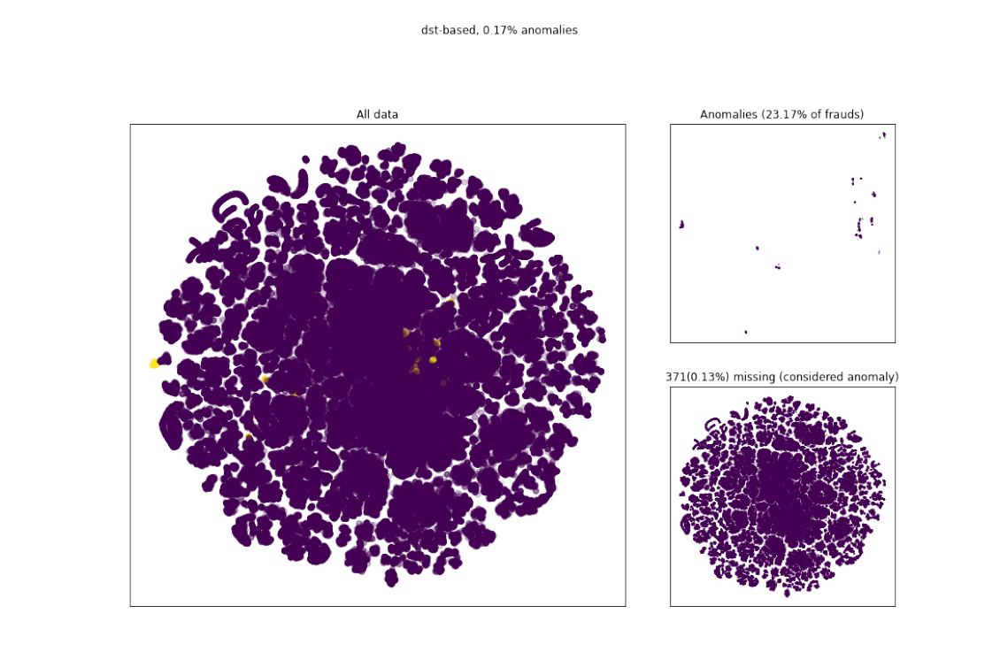

...

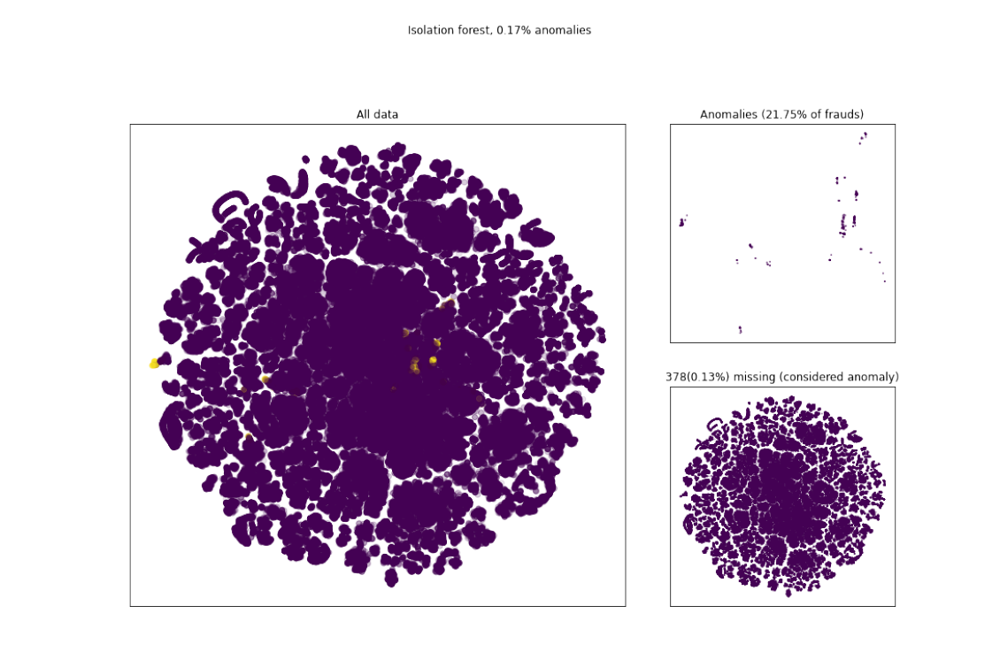

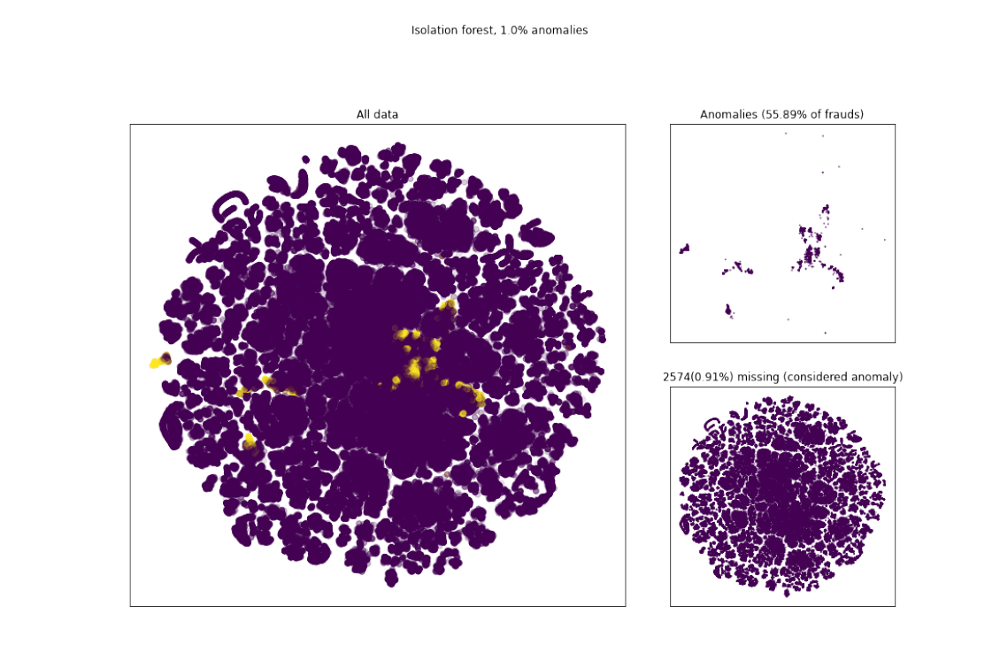

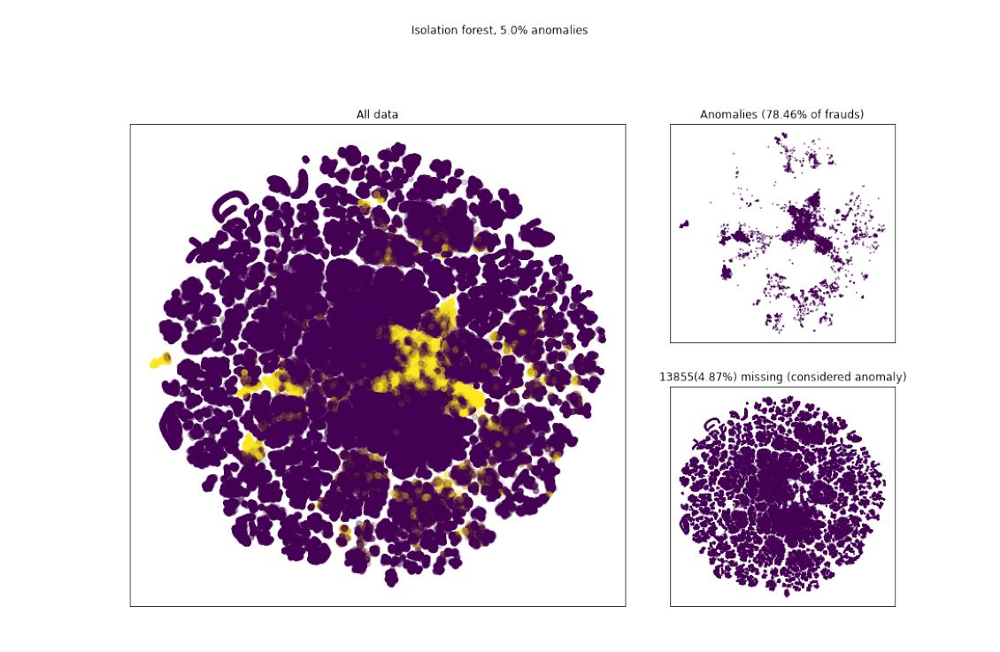

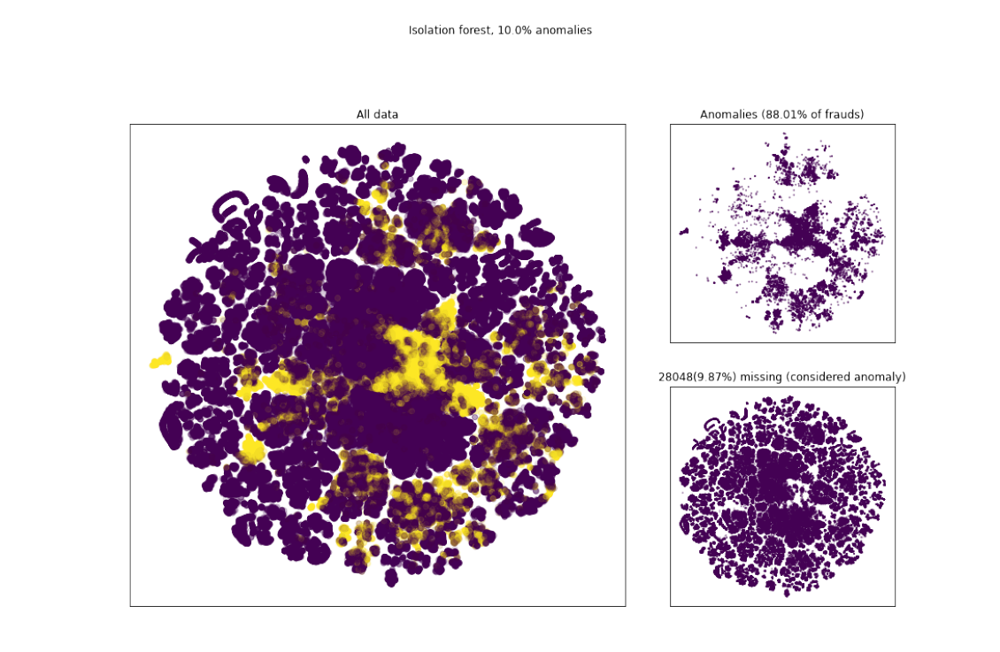

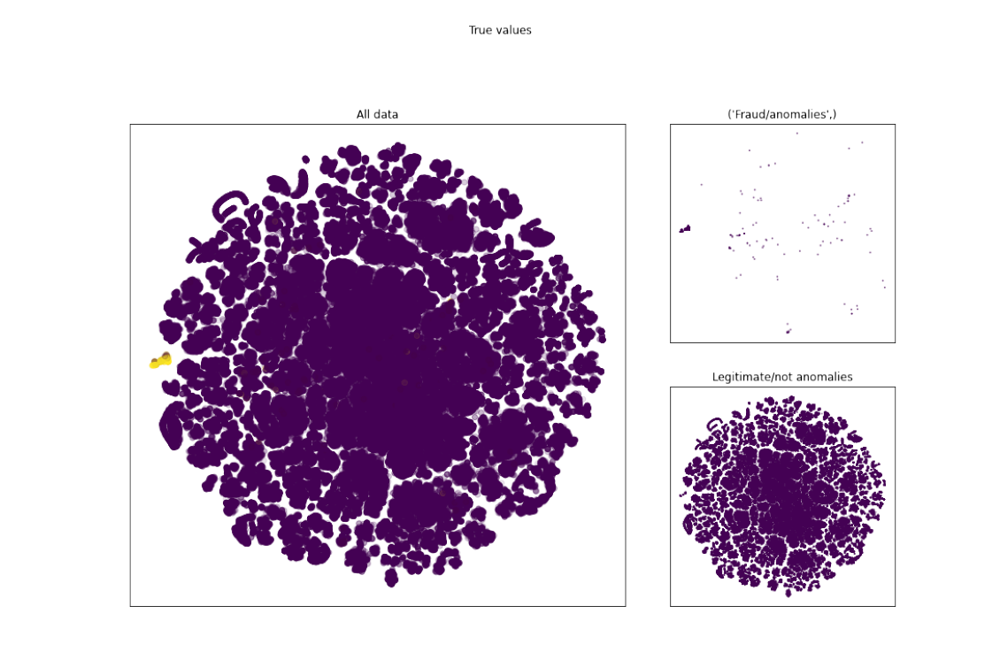

In [46]:
if not os.path.exists('viz'):
    os.makedirs('viz')
options = comparison_df['method'] + ', ' + comparison_df['anomalies %'].astype('str') + '% anomalies'
options[-1] = 'True values'
options = [(item, i) for i, item in enumerate(options)]
#interact(viz_options, option=options);
for option in options:
    viz_options(option[1])

# Выводы
Мы попробовали 6 разных методов поиска аномалий в данных:
1. метод с использованием стандартного отклонения
2. метод с использованием межквартильного расстояния
3. distance-based метод
4. density-based метод (DBSCAN)
5. One Class SVM
6. Isolation Forest

Пришло время сделать выводы о применимести этих методов для non-supervised способа выявления мошеннических транзакций. Ниже, методы будут упоминаться с использованием их номера выше и расположены в порядке убывания метрики качества: recall или процент отловленных случаев мошенничества.

Выдать результаты а рамках экспертной оценки загрязненности датасета получилось у методов 3, 6, 1, 2 но все они по оценке качества выдали очень низкую метрику качества, ниже 50%. В оставшихся двух (4, 5) экспертная оценка использовалась, но по техническим причинам процент аномалий был больше 3.6 и 0.96 процентов соответственно. Неплохая метрика в 68% найденных аномалий вышла с методом 4, 5й показал себя лучше ранее перечисленных, но все равно ниже 50%.

Итого, с использованием экспертной оценки не получается получить хороших результатов, поэтому было так же попробовано увеличить процент загрязненности. При этом увеличении метрика качества растет (~56-92%), но при этом мы захватываем все большое число (от 371 до 52884) и процент (0.13-18.6%) от лигитимных транзакций. Так же из-за размера датасета лучше не использовать 4, 5 т.к. они отрабатывают очень долго. 3, 6 работают довольно быстро и дают неплохие результаты.

В целом, если придерживаться экспертной оценки загрязненности unsupervised метод поиска мошеннических транзакций работают плохо, нужно либо увеличивать процент загрязнения и мириться с тем, что процент реальных актов мошенничества в отобранных алгоритмами, либо использовать supervised подходы.